# **Imports**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import scipy.io as sci

import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

In [ ]:
# Load and preprocess images

# Samson
def load_samson(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Y_clean.mat')
    Y_clean = Y_file['Y_clean'].astype(float)

    A_file = sci.loadmat(path + 'A_true.mat')
    A_true = A_file['A_true']

    E_file = sci.loadmat(path + 'E.mat')
    E = E_file['E']

    # Image dimensions
    nCol, nRow = 95, 95
    n, m = 96, 96
    r_channels = 3
    n_bands = 156

    # Reflexive padding
    Y = np.zeros((n, m, n_bands))
    Y[:-1, :-1] = Y_clean
    Y[-1, :], Y[:, -1] = Y[0, :], Y[:, 0]

    A_gt = np.zeros((n, m, r_channels))
    A_gt[:-1, :-1] = A_true
    A_gt[-1, :], A_gt[:, -1] = A_gt[0, :], A_gt[:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(np.transpose(A_gt, (2,0,1)), dtype=torch.float32)
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(np.transpose(Y, (2,0,1)).reshape((n_bands, n*m)), dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Jasper
def load_jasper(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'jasperRidge2_R198.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end4.mat')
    E = gt_file['M']
    A_gt = gt_file['A']

    # Image dimensions
    r_channels = 4
    n_bands = 198
    n, m = 100, 100

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y, dtype=torch.float32)

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Urban
def load_urban(path):
    Data = {}

    # Read files
    Y_file = sci.loadmat(path + 'Urban_R162.mat')
    Y = Y_file['Y'].astype(float)

    gt_file = sci.loadmat(path + 'end6_groundTruth.mat')
    E = gt_file['M']
    A_true = gt_file['A']

    # Image dimensions
    r_channels = 6
    n_bands = 162
    nCol, nRow = 307, 307
    n, m = 308, 308

    # Reflexive padding
    Y_b = np.zeros((n_bands,n,m))
    Y_b[:,:-1, :-1] = Y.reshape((n_bands,nCol,nRow))
    Y_b[:,-1, :], Y_b[:,:, -1] = Y_b[:,0,:], Y_b[:,:,0]

    A_gt = np.zeros((r_channels, n, m))
    A_gt[:,:-1, :-1] = A_true.reshape((r_channels,nCol,nRow))
    A_gt[:,-1, :], A_gt[:,:, -1] = A_gt[:,0, :], A_gt[:,:, 0]

    # Return the objects in a dictionnary
    Data['r_channels'] = r_channels
    Data['n_bands'] = n_bands
    Data['image_dimensions'] = n, m
    Data['A_gt'] = torch.tensor(A_gt, dtype=torch.float32).reshape([r_channels,n,m])
    Data['E'] = torch.tensor(E, dtype=torch.float32)
    Data['Y'] = torch.tensor(Y_b, dtype=torch.float32).reshape([n_bands,n*m])

    # Normalize Y
    Data['Y'] = Data['Y']/Data['Y'].max()

    return Data

# Plot images
def plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m):
    # Plot abundances
    print('Abundances:')
    plt.figure(figsize=(15,10))
    for i in range(r_channels):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(A_gt_tensor[i,:,:])
    plt.tight_layout()
    plt.show()

    print('Endmembers:')
    plt.plot(E_tensor)
    plt.show()

    print('Image:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow((Y_tensor).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

    print('E@A:')
    plt.figure(figsize=(15,10))
    for i in range(6):
        ax = plt.subplot(2, 3, i+1)
        ax.imshow(torch.mm(E_tensor,
                           A_gt_tensor.view(r_channels, n*m)).reshape(n_bands,n,m)[i,:,:])
    plt.tight_layout()
    plt.show()

# **Importing data**

In [ ]:
path = "./"

#Data = load_samson(path)
#Data = load_jasper(path)
Data = load_urban(path)

r_channels = Data['r_channels']
n_bands = Data['n_bands']
n, m = Data['image_dimensions']
A_gt_tensor = Data['A_gt']
E_tensor = Data['E']
Y_tensor = Data['Y']

# Groud truth loss
nn.MSELoss()(torch.mm(E_tensor, A_gt_tensor.view(r_channels, n*m)), Y_tensor)

tensor(0.0054)

# **Plot data**

Abundances:


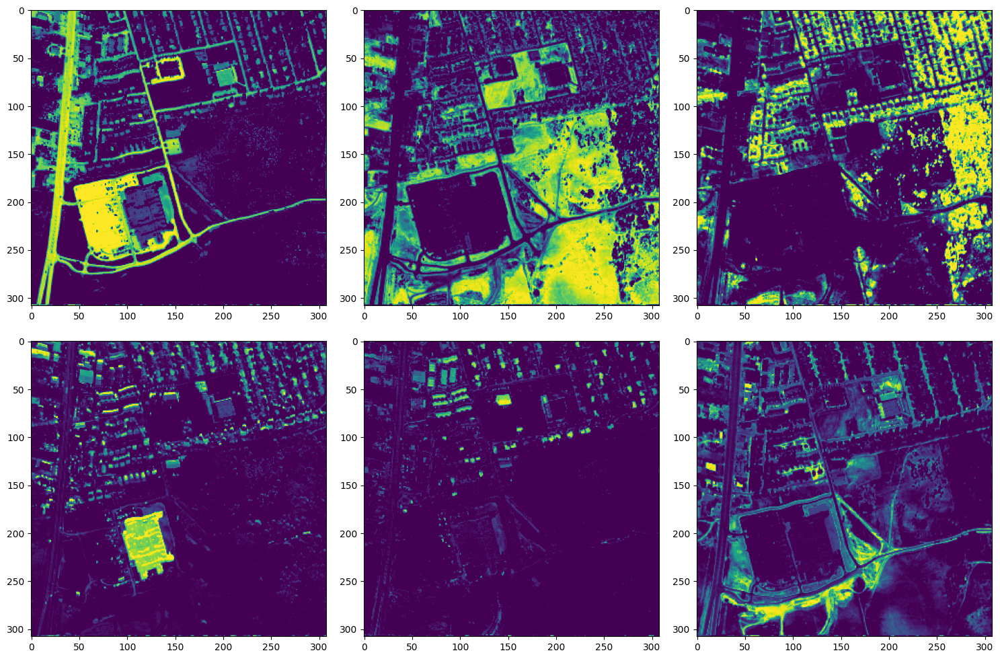

Endmembers:


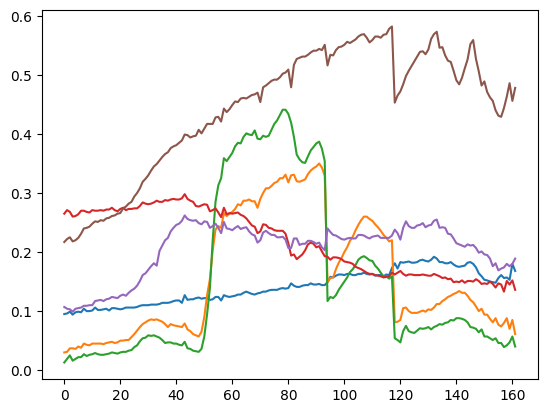

Image:


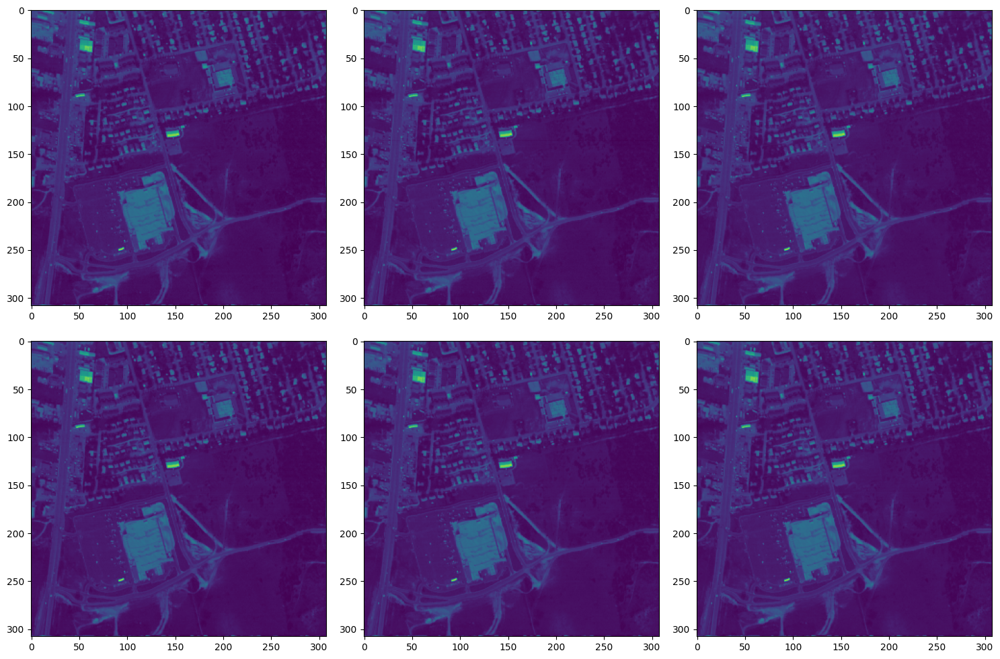

E@A:


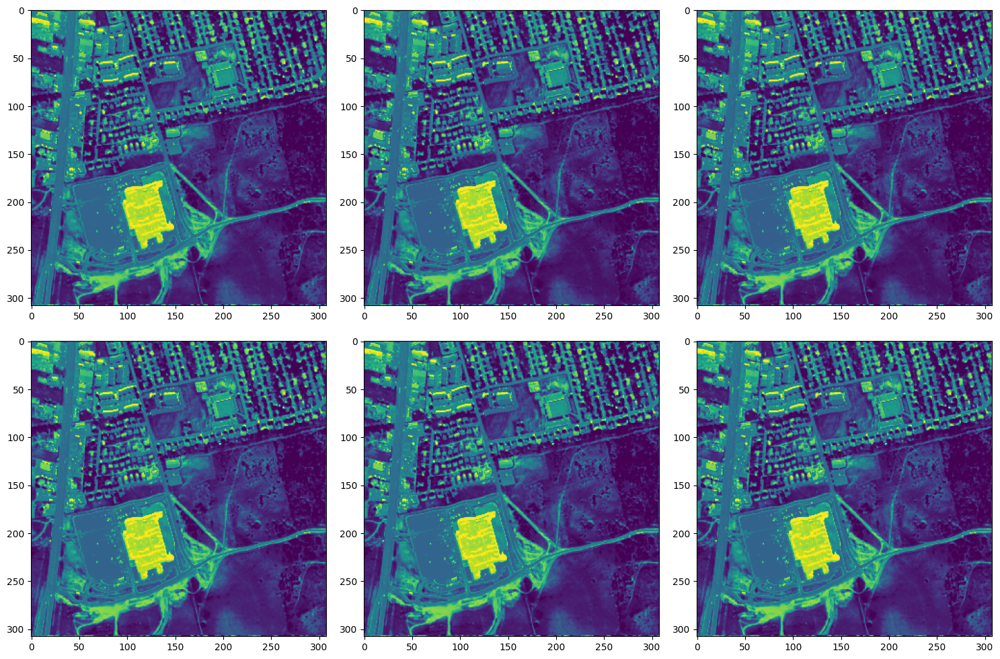

In [ ]:
plot_image(A_gt_tensor, E_tensor, Y_tensor, r_channels, n_bands, n, m)

# **Initialisations**

### **Random initialisation**

In [ ]:
A = torch.normal(0,1,size=(1,r_channels,n,m), dtype=torch.float32)

Random Initialisation:


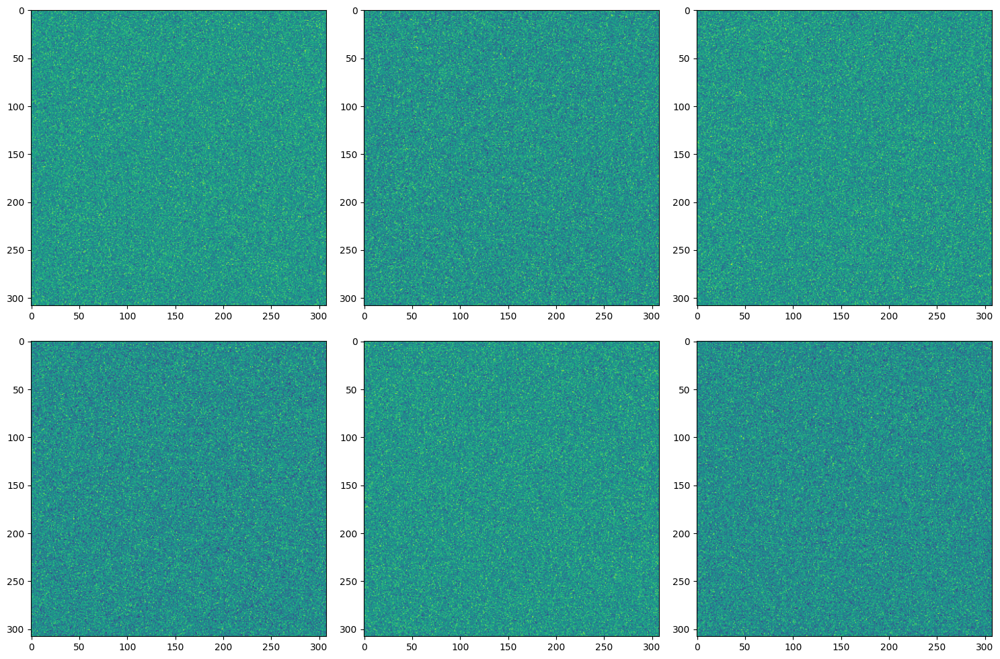

In [ ]:
print('Random Initialisation:')
plt.figure(figsize=(15,10))
for i in range(r_channels):
    ax = plt.subplot(2, 3, i+1)
    ax.imshow(A[0,i,:,:])
plt.tight_layout()
plt.show()

## **PALM intialisation**

In [ ]:
def prox_positive(S): # TO DO
    S = np.maximum(0,S)
    return S

In [ ]:
def PALM(X, n=2, nbIt = 100, Ainit=None, Sinit=None): # TO DO : reutiliser le PALM du TP precedent et l'adapter

    if Ainit is None :
        A_est = np.random.rand(X.shape[0], n)
    else :
        A_est = Ainit
    if Sinit is None :
        S_est = np.random.rand(n, X.shape[1])
    else:
        S_est = Sinit

    k=0

    while k < nbIt:

        gamma = 0.9/np.linalg.norm(A_est@(A_est.T))
        eta = 0.9/np.linalg.norm(S_est@(S_est.T))

        S_est = prox_positive(S_est + gamma * A_est.T @ (X-A_est@S_est))
        A_est = prox_positive( A_est + eta * (X-A_est@S_est)@S_est.T)

        k+=1

    return A_est, S_est

In [ ]:
A_est, S_est = PALM(Y_tensor.detach().cpu().numpy(), n=6, nbIt = 1000)

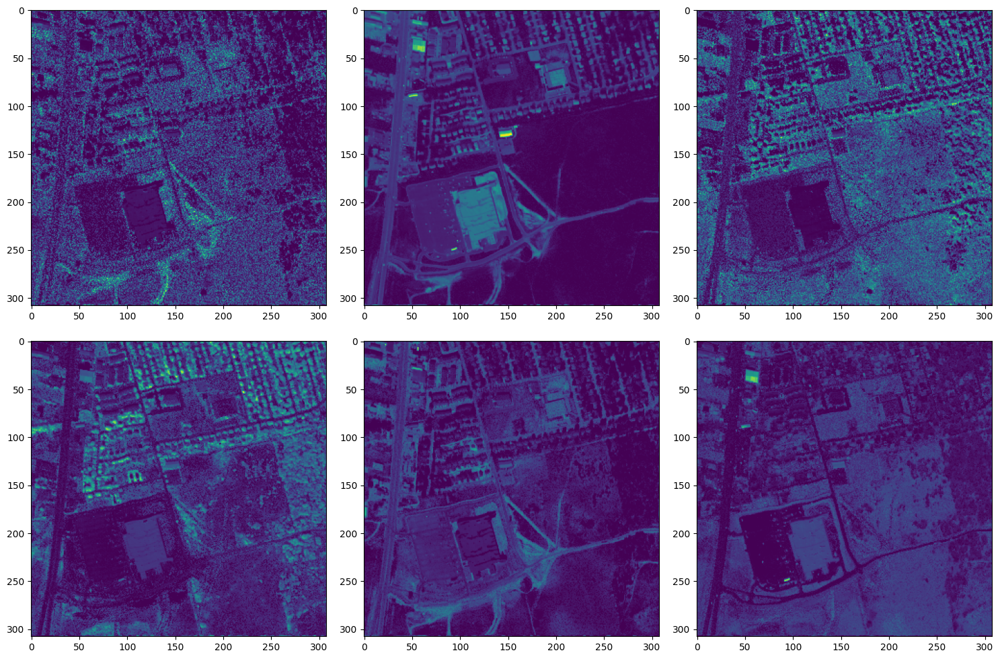

In [ ]:
plt.figure(figsize=(15,10))
for i in range(r_channels):
    ax = plt.subplot(2, 3, i+1)
    ax.imshow(S_est[i,:].reshape(n,m))
plt.tight_layout()
plt.show()

In [ ]:
palm_init = np.zeros((6, 308, 308))

for i in range(6):
  palm_init[i,:,:] = S_est[i,:].reshape(n,m)

# Convert the reshaped array to a PyTorch tensor
palm_tensor = torch.from_numpy(palm_init).unsqueeze(0)

## **NMF initialisation**

In [ ]:
def simplexProx(X,epsilon = 0):
#     Given X,  computes its projection Y onto the simplex

#       Delta = { x | x >= 0 and sum(x) <= 1 },

# that is, Y = argmin_z ||x-X||_2  such that z in S.

# If X is a matrix, is projects its columns onto Delta to generate Y.


# ****** Input ******
# X       : m-by-r matrix
# epsilon : r-by-1 vector, generally positive and taken = 0

# ****** Output ******
# Y       : the projected matrix


    if np.isscalar(epsilon) == 1:
        epsilon = epsilon*np.ones(np.shape(X)[1])

    Y = np.zeros(np.shape(X))

    for ii in range(np.shape(X)[1]): # The prox is separable over the columns of X
        x = X[:,ii].copy() # We work on each column separately
        xsort = np.sort(x) # We need to sort the x value to apply the dichotomy

        index_min=0 # Index values for the dichotomy
        index_max=len(x)-1;

        # mu s.t. x_i > mu-epsilon, forall i
        mu_min=xsort[0]+epsilon[ii] # mu is the parameter required for the projection

        min_sum=np.sum(x)-len(x)*mu_min

        if min_sum < 1:# If the vector already satisfies the sum to at most one constraint
            mu=(np.sum(x)-1.)/np.float(len(x))
            y=np.maximum(-epsilon[ii]*np.ones(len(x)), x-mu) # Element-wise max
            Y[:,ii]=y;
        else:
            # Use dichotomy for finding the optimal mu value
            stop = False
            it = 0
            while stop == False:
                it += 1

                cur_ind = int(np.round((float(index_min)+float(index_max)+1e-6)/2.))
                mu=xsort[cur_ind]+epsilon[ii]
                y=np.maximum(-epsilon[ii]*np.ones(len(x)), x-mu)

                val_constr = np.sum(y)
                if val_constr < 1.:
                    index_max=cur_ind # Because the objective is decreasing with mu and indMax > indMin
                elif val_constr > 1.:
                    index_min=cur_ind

                else: # We found the best mu
                    Y[:,ii]=y
                    stop = True


                if index_max == index_min + 1:# This is a stopping condition, as the constraint function is piecewise linear
                    stop = True


            mu_inf=xsort[index_min]+epsilon[ii];
            mu_sup=xsort[index_max]+epsilon[ii];
            constr_inf = np.sum(np.maximum(-epsilon[ii]*np.ones(len(x)),x-mu_inf))
            constr_sup = np.sum(np.maximum(-epsilon[ii]*np.ones(len(x)),x-mu_sup))

            slope=(constr_sup-constr_inf)/(mu_sup-mu_inf)
            mu_opt=(1.-constr_inf)/slope+mu_inf # Because the constraint function is piecewise linear

            # Compute the corresponding column of Y
            y=np.maximum(-epsilon[ii]*len(x), x-mu_opt)

            Y[:,ii]=y



    return Y




#%%
def FGM_MM_nonneg(A,C,W0=0,maxiter=500,proj=1):
    # Fast gradient method to solve nonnegative least squares.
    # See Nesterov, Introductory Lectures on Convex Optimization: A Basic
    # Course, Kluwer Academic Publisher, 2004.

    # This code solves:

    #     min_{x_i in R^r_+} sum_{i=1}^m ( x_i^T A x_i - 2 c_i^T x_i ), if proj == 1
    #     min_{x_i in S} sum_{i=1}^m ( x_i^T A x_i - 2 c_i^T x_i ), if proj == 2 (with S = simplex)
    # [W,e] = FGMfcnls(A,C,W0,maxiter)

    # ****** Input ******
    # A      : Hessian for each row of W, positive definite
    # C      : linear term <C,W>
    # W0     : m-by-r initial matrix
    # maxiter: maximum numbre of iterations (default = 500).
    # proj   : =1, nonnegative orthant
    #          =2, nonnegative orthant + sum-to-one constraints on columns
    #
    # ****** Output ******
    # W      : approximate solution of the problem stated above.
    # e      : e(i) = error at the ith iteration

    if np.isscalar(W0):
        W0 = np.zeros(np.shape(C));

    L = np.linalg.norm(A,2)# Pas evident...
    e = np.zeros(maxiter)
    # Extrapolation parameter
    beta = (1.-np.sqrt(np.linalg.cond(A))) / (1. + np.sqrt(np.linalg.cond(A)));

    # Project initialization onto the feasible set
    if proj == 1:
        W = np.maximum(W0,0)
    elif proj == 2:
        W = simplexProx(W0)


    Y = W # Initialization of the second sequence (for the acceleration)
    ii = 0;
    eps0 = 0.
    eps = 1.
    delta = 1e-6

    while ii < maxiter and eps >= delta*eps0:
        # print("FGM_MM_nonneg, it %s"%ii)
        # Previous iterate
        Wp = W

        # FGM Coefficients
        # alpha(i+1) = ( sqrt(alpha(i)^4 + 4*alpha(i)^2 ) - alpha(i)^2) / (2);
        # beta(i) = alpha(i)*(1-alpha(i))/(alpha(i)^2+alpha(i+1));

        # Projected gradient step from Y
        W = Y - (Y@A-C) / L

        # Projection
        if proj == 1:
            W = np.maximum(W,0.)
        elif proj == 2:
            W = simplexProx( W )


        # Linear combination of iterates
        Y = W + beta*(W-Wp)

        # Error
        e[ii] = np.sum((W.T@W)*A) - 2.*np.sum(W*C)


        # Restart: fast gradient methods do not guarantee the objective
        # function to decrease, a good heursitic seems to restart whenever it
        # increases although the global convergence rate is lost! This could
        # be commented out.

        if ii >= 2 and e[ii] > e[ii-1]:
            Y = W

        if ii == 1:
            eps0 = np.sqrt(np.sum((W-Wp)**2))

        eps = np.sqrt(np.sum((W-Wp)**2))

        ii += 1
    return W,e

#%%
def nnls_FPGM(X,W,delta=1e-6,inneriter=500,proj=0,alpha0=0.05,H = 0,options=0 ):

     # Computes an approximate solution of the following nonnegative least
     # squares problem (NNLS)

     #           min_{H >= 0} ||X-WH||_F^2

     # using a fast gradient method;
     # See Nesterov, Introductory Lectures on Convex Optimization: A Basic
     # Course, Kluwer Academic Publisher, 2004.

     # Input / Output; see nnls_input_output.m

     # + options.proj allows to use a contraints on the columns or rows of H so
     #   that the entries in each column/row sum to at most one
     #   options.proj = 0: no projection (default).
     #   options.proj = 1: projection of the columns on {x|x>=0, sum(x) <= 1}
     #   options.proj = 2: projection of the rows {x|x>=0, sum(x) = 1}

     # + options.alpha0 is the FPGM  extrapolation parameter (default=0.05). If options.alpha0 = 0 --> no acceleration, PGM




    # If no initial matrices are provided, H is initialized as follows:
    if np.isscalar(H):
        H = np.zeros((np.shape(W)[1],np.shape(X)[1]))


    # Hessian and Lipschitz constant
    WtW = W.T@W
    L = np.linalg.norm(WtW,2)
    # Linear term
    WtX = W.T@X

    alpha = np.zeros(inneriter + 1)
    beta = np.zeros(inneriter)
    alpha[0] = alpha0

    if options == 0: # Project onto the non-negative orthant
        H = np.maximum(H,0)
    elif options == 1: # Project columns of H onto the simplex and origin
        H = np.maximum(H,0)
        K = np.where(np.sum(H,axis=0) > 1.)[0]
        H[:,K] = simplexProx( H[:,K] )
    elif options == 2: # Project rows of H onto the simplex
        H = simplexProx(H.T)
        H = H.T



    Y = H # Second sequence
    ii = 0
    # Stop if ||V^{k}-V^{k+1}||_F <= delta * ||V^{0}-V^{1}||_F
    eps0 = 0
    eps = 1
    while ii < inneriter and eps >= delta*eps0:
        # Previous iterate
        Hp = H;
        # FGM Coefficients; see Nesterov's book
        alpha[ii+1] = ( np.sqrt(alpha[ii]**4 + 4*alpha[ii]**2 ) - alpha[ii]**2) / 2.
        beta[ii] = alpha[ii]*(1.-alpha[ii])/(alpha[ii]**2+alpha[ii+1])
        # Projection step
        H = Y - (WtW@Y-WtX) / L

        if options == 0:
            H = np.maximum(H,0);
        elif options == 1:
            H = np.maximum(H,0) # Project columns of H onto the set {x|x>=0, sum(x) <= 1}
            K = np.where(np.sum(H,axis=0) > 1.)[0]
            H[:,K] = simplexProx( H[:,K] )
        elif options == 2:
            H = simplexProx(H.T) # Project rows of H onto the simplex
            H = H.T

        # Linear combination of iterates
        Y = H + beta[ii]*(H-Hp)
        if ii == 1:
            eps0 = np.linalg.norm(H-Hp,'fro')

        eps = np.linalg.norm(H-Hp,'fro')
        ii = ii + 1;



    return H,WtW,WtX





#%%
def normalizeWH(W,H,sumtoone,X):
    # Normalization depending on the NMF model
    if sumtoone == 1: # Normalize so that H^Te <= e entries in cols of H sum to at most 1

        Hn = simplexProx( H );
        if np.linalg.norm(Hn - H) > 1e-3*np.linalg.norm(Hn):
           H = Hn
           # Reoptimize W, because this normalization is NOT w.l.o.g.
           W,WtW_temp,WtX_temp = nnls_FPGM(X.T,H.T,H = W.T,inneriter=100)
           W = W.T

        H = Hn

    elif sumtoone == 2: # Normalize so that He = e, entries in rows of H sum to 1
        scalH = np.sum(H,axis=1)
        H = np.diag( scalH**(-1) )@H
        W = W@np.diag( scalH )

    elif sumtoone == 3: # Normalize so that W^T e = e, entries in cols of W sum to 1
        scalW = np.sum(W,axis=0)
        H = np.diag( scalW )@H
        W = W@np.diag( scalW**(-1) )


    return W,H


#%%
def minvolNMF(X,r,W,H,lamb=0.1,delta=0.1,model=3,maxiter=100,inneriter=10,target = None):
    # W,H : initializations (W par SNPA, H par NNLS)

    # Normalization
    W,H = normalizeWH(W,H,model,X) # OM pour modele 2
    # Initializations
    normX2 = np.sum(X**2)
    normX = np.sqrt(normX2)

    WtW = W.T@W;
    WtX = W.T@X;

    err1 = np.zeros(maxiter)
    err2 = np.zeros(maxiter)
    e = np.zeros(maxiter)

    # Initial error and set of of lambda
    err1[0] = np.maximum(0,normX2-2.*np.sum(WtX*H)+np.sum(WtW*(H@H.T)))
    err2[0] = np.log(np.linalg.det(WtW + delta*np.eye(r)));  #OK

    lamb = lamb * np.maximum(1e-6,err1[0]) / (np.abs( err2[0] ))

    e[0] =  err1[0] + lamb * err2[0] # OK



    # projection model for H
    if model == 1:
        proj = 1
    elif model == 2:
        proj = 2
    elif model == 3:
        proj = 0


    # Main loop

    for ii in range(1,maxiter):
        #*** Update W ***
        XHt = X@H.T
        HHt = H@H.T

        Y = np.linalg.inv( ( W.T@W + delta*np.eye(r) ) )
        A = lamb*Y + HHt

        if model <= 2:
            W,irr = FGM_MM_nonneg(A,XHt,W,inneriter,proj=1)
        elif model == 3:
            W,irr = FGM_MM_nonneg(A,XHt,W,inneriter,proj=2)

        # *** Update H ***
        Hinit = H

        H,WtW,WtX = nnls_FPGM(X,W,H=Hinit,proj=proj,inneriter=inneriter,delta=delta)

        err1[ii] = np.maximum(0, normX2 - 2.*np.sum(WtX*H)  + np.sum(WtW*(H@H.T)))
        err2[ii] = np.log(np.linalg.det(WtW + delta*np.eye(r)))

        e[ii] = err1[ii] + lamb * err2[ii]

        # Tuning lambda to obtain options.target relative error
        if np.isscalar(target):
            if np.sqrt(err1[ii])/normX > target+0.001:
                lamb = lamb*0.95
            elif np.sqrt(err1[ii])/normX < target-0.001:
                lamb = lamb*1.05


    return W,H,e,err1,err2

In [ ]:
S_nmf = np.random.rand(S_est.shape[0],S_est.shape[1])
A_nmf = np.random.rand(A_est.shape[0],A_est.shape[1])
[W3_t,H3_t,e3_t,er13_t,er23_t] = minvolNMF(Y_tensor.detach().cpu().numpy(),6,A_nmf,S_nmf,lamb=1.,delta=0.1,model=1,maxiter=1000,inneriter=10,target = 0.05)

<ipython-input-27-60f3d1df4ff3>:37: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mu=(np.sum(x)-1.)/np.float(len(x))


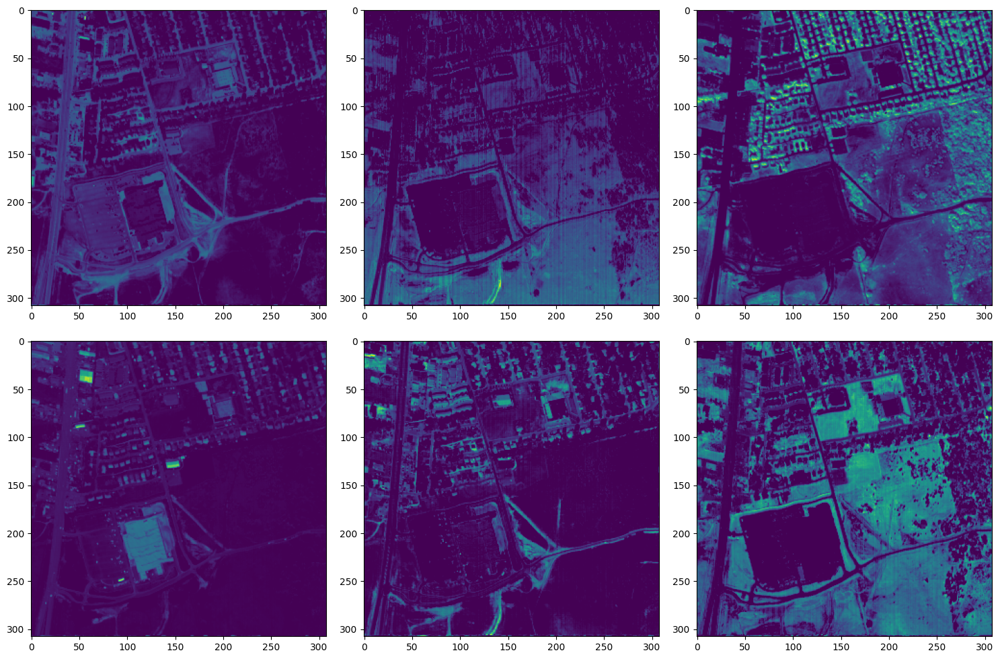

In [ ]:
plt.figure(figsize=(15,10))
for i in range(r_channels):
    ax = plt.subplot(2, 3, i+1)
    ax.imshow(H3_t[i,:].reshape(n,m))
plt.tight_layout()
plt.show()

In [ ]:
nmf_init = np.zeros((6, 308, 308))

for i in range(6):
  nmf_init[i,:,:] = H3_t[i,:].reshape(n,m)

# Convert the reshaped array to a PyTorch tensor
nmf_init = torch.from_numpy(nmf_init).unsqueeze(0)

## **Model**

In [ ]:
# Models
encoder_channels = [256,256]
decoder_channels = [256,256,r_channels]
skip_channels = 4

# Define the network architecture
class Undip_net_paper(nn.Module):
  def __init__(self):
    super(Undip_net_paper, self).__init__()

    self.encoder1 = nn.Sequential(nn.Conv2d(r_channels, encoder_channels[0], (3, 3),
                                            stride=(2, 2), padding_mode='reflect', padding=1, dilation=1), # (308,308) to (154,154)
                                  nn.BatchNorm2d(encoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )

    self.encoder2 = nn.Sequential(nn.Conv2d(encoder_channels[0], encoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(encoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (154,154)
    )

    self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')


    self.skip = nn.Sequential(nn.Conv2d(r_channels, skip_channels, (1, 1), stride=(1, 1),
                                        padding=0, dilation=1),
                              nn.BatchNorm2d(skip_channels),
                              nn.LeakyReLU(inplace=True, negative_slope=0.1),
    )



    self.decoder1 = nn.Sequential(nn.BatchNorm2d(encoder_channels[1]+skip_channels),
                                  nn.Conv2d(encoder_channels[1]+skip_channels, decoder_channels[0],
                                            (3, 3), stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[0]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1)
    )



    self.decoder2 = nn.Sequential(nn.Conv2d(decoder_channels[0], decoder_channels[1], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.BatchNorm2d(decoder_channels[1]),
                                  nn.LeakyReLU(inplace=True, negative_slope=0.1), # (77,77)
    )

    self.decoder3 = nn.Sequential(nn.Conv2d(decoder_channels[1], decoder_channels[2], (3, 3),
                                            stride=(1, 1), padding_mode='reflect', padding=1, dilation=1),
                                  nn.Softmax(dim=1)
    )


  def forward(self, input):


    current_feature = self.encoder1(input)
    current_feature = self.encoder2(current_feature)
    current_feature = self.upsample(current_feature)

    current_skip_output = self.skip(input)

    current_feature = torch.cat((current_feature,current_skip_output), dim=1)


    current_feature = self.decoder1(current_feature)
    current_feature = self.decoder2(current_feature)
    output = self.decoder3(current_feature)


    return output

In [ ]:
# Training algorithm
def train(model, input, E_tensor, Y_tensor, epochs=3000, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    model = model.to(device)
    input = input.to(device)
    criterion = criterion.to(device)
    E_tensor = E_tensor.to(device)
    Y_tensor = Y_tensor.to(device)

    history = {'losses': [],
               'RMSE': [],
               'outputs': torch.zeros([epochs, 1, r_channels, n, m])}

    model.eval() if optimizer is None else model.train()
    for epoch in range(1, epochs + 1):

        model.train()
        train_loss = 0.0

        optimizer.zero_grad()

        output = model(input)

        loss = criterion(torch.mm(E_tensor, output.view(r_channels, n*m)), Y_tensor)

        print('Epoch {}: '.format(epoch), loss.item())
        history['losses'].append(loss.item())
        history['RMSE'].append(nn.MSELoss()(torch.mm(E_tensor, output.view(r_channels, n*m)),
                                            Y_tensor).item())
        history['outputs'][epoch-1] = output.detach()

        loss.backward()
        optimizer.step()

    return output, history

In [ ]:
def plot_history(history, A_gt_tensor):
    plt.figure(figsize=(10,3))
    plt.subplot(1,3,1)
    plt.title('Loss function / RE')
    plt.plot(history['losses'])
    plt.subplot(1,3,2)
    plt.title('RMSE')
    plt.plot(history['RMSE'])
    plt.subplot(1,3,3)
    plt.title('Abuncances MAE')
    plt.plot([nn.L1Loss()(o, A_gt_tensor.view([1,r_channels,n,m])) for o in history['outputs']])
    plt.tight_layout()
    plt.show()

In [ ]:
# View results
def view_results(r_channels, A, A_gt_tensor):
    plt.figure(figsize=(15,5))
    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1)
        im = A.cpu().detach()[0, i,:,:]
        ax.imshow(im)
        plt.title('Result')

    for i in range(r_channels):
        ax = plt.subplot(2, r_channels, i+1+r_channels)
        im = A_gt_tensor.view([1,r_channels,n,m])[0,i,:,:]
        ax.imshow(im)
        plt.title('Ground truth')

    plt.tight_layout()
    plt.show()

## **Train with random initialisation**

In [ ]:
Undip_model_random = Undip_net_paper()
lr = 0.001
epochs = 1000

In [ ]:
output, history = train(Undip_model_random, A, E_tensor, Y_tensor, lr=lr, epochs=epochs)

Epoch 1:  0.0116428816691041
Epoch 2:  0.00894218310713768
Epoch 3:  0.008904856629669666
Epoch 4:  0.00842633843421936
Epoch 5:  0.00798273179680109
Epoch 6:  0.007306338287889957
Epoch 7:  0.006669400259852409
Epoch 8:  0.006907596718519926
Epoch 9:  0.00687742093577981
Epoch 10:  0.0063579753041267395
Epoch 11:  0.006062530446797609
Epoch 12:  0.005744465626776218
Epoch 13:  0.0054746875539422035
Epoch 14:  0.005275724455714226
Epoch 15:  0.005105611402541399
Epoch 16:  0.004955684300512075
Epoch 17:  0.004809409845620394
Epoch 18:  0.004646697547286749
Epoch 19:  0.0045214262790977955
Epoch 20:  0.004392830189317465
Epoch 21:  0.004258113447576761
Epoch 22:  0.004179780837148428
Epoch 23:  0.004086792003363371
Epoch 24:  0.003963514696806669
Epoch 25:  0.0039185285568237305
Epoch 26:  0.0038731652311980724
Epoch 27:  0.0037712594494223595
Epoch 28:  0.0036966109182685614
Epoch 29:  0.003642990253865719
Epoch 30:  0.003573069116100669
Epoch 31:  0.003501283936202526
Epoch 32:  0.003

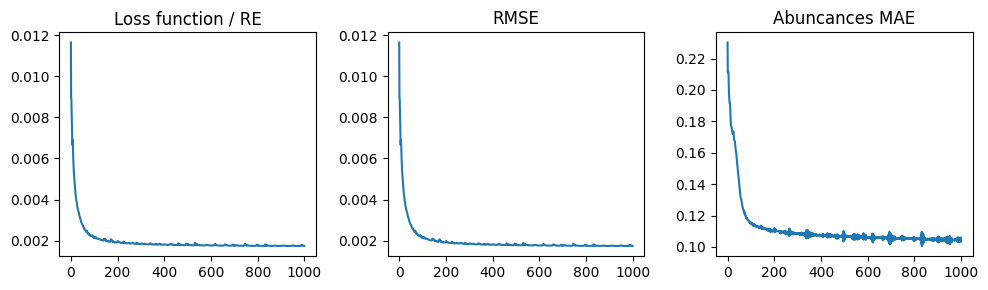

In [ ]:
plot_history(history, A_gt_tensor)

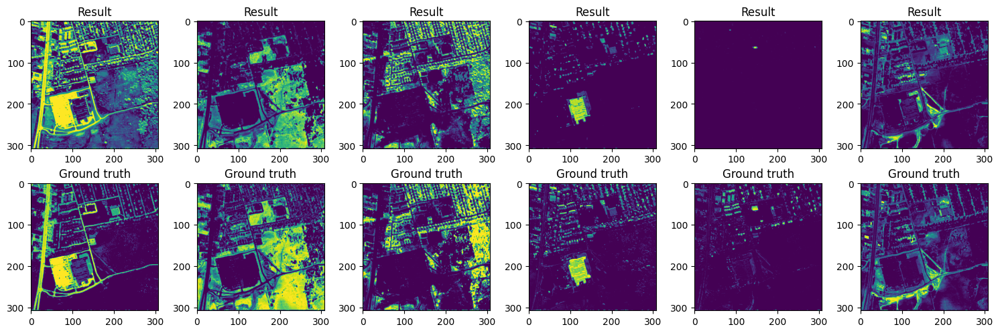

In [ ]:
view_results(r_channels, output, A_gt_tensor)

## **Train with PALM initialisation**

In [ ]:
Undip_model = Undip_net_paper()
lr = 0.001
epochs = 1000

In [ ]:
output, history = train(Undip_model, palm_tensor.float(), E_tensor, Y_tensor, lr=lr, epochs=epochs)

Epoch 1:  0.011747711338102818
Epoch 2:  0.006410425063222647
Epoch 3:  0.013346623629331589
Epoch 4:  0.0072579579427838326
Epoch 5:  0.006113825831562281
Epoch 6:  0.00572269456461072
Epoch 7:  0.005744399502873421
Epoch 8:  0.005757536739110947
Epoch 9:  0.005676744040101767
Epoch 10:  0.0056174034252762794
Epoch 11:  0.005604930687695742
Epoch 12:  0.005592303816229105
Epoch 13:  0.005552878137677908
Epoch 14:  0.00549193425104022
Epoch 15:  0.005436417181044817
Epoch 16:  0.005413290113210678
Epoch 17:  0.005406940821558237
Epoch 18:  0.005376906134188175
Epoch 19:  0.005329381208866835
Epoch 20:  0.005300815217196941
Epoch 21:  0.005292023066431284
Epoch 22:  0.005275047849863768
Epoch 23:  0.005240438971668482
Epoch 24:  0.005210184492170811
Epoch 25:  0.005203551147133112
Epoch 26:  0.005193217191845179
Epoch 27:  0.005162958055734634
Epoch 28:  0.005143152549862862
Epoch 29:  0.005137445870786905
Epoch 30:  0.005123193841427565
Epoch 31:  0.005102616269141436
Epoch 32:  0.0050

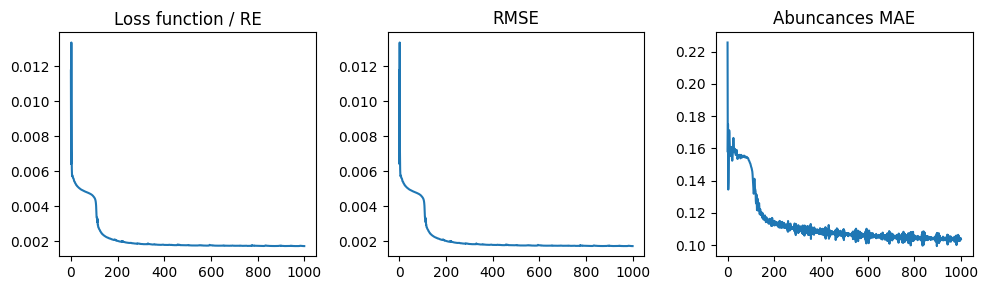

In [ ]:
plot_history(history, A_gt_tensor)

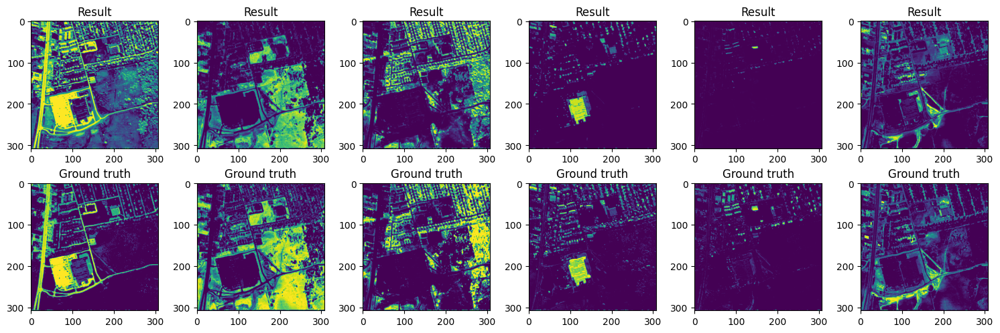

In [ ]:
view_results(r_channels, output, A_gt_tensor)

## **Train with NMF initialisation**

In [ ]:
Undip_model_nmf = Undip_net_paper()

In [ ]:
output, history = train(Undip_model_nmf, nmf_init.float(), E_tensor, Y_tensor, lr=lr, epochs=epochs)

Epoch 1:  0.01211365032941103
Epoch 2:  0.004540935158729553
Epoch 3:  0.006222614087164402
Epoch 4:  0.005002281628549099
Epoch 5:  0.004469430074095726
Epoch 6:  0.003805997082963586
Epoch 7:  0.003673217026516795
Epoch 8:  0.0036666234955191612
Epoch 9:  0.003586897626519203
Epoch 10:  0.0034482453484088182
Epoch 11:  0.003442171262577176
Epoch 12:  0.003396686166524887
Epoch 13:  0.0032444875687360764
Epoch 14:  0.0032828329131007195
Epoch 15:  0.003101177280768752
Epoch 16:  0.0031009477097541094
Epoch 17:  0.003017507027834654
Epoch 18:  0.0030363646801561117
Epoch 19:  0.002940395148470998
Epoch 20:  0.0029296569991856813
Epoch 21:  0.0028731992933899164
Epoch 22:  0.002864124486222863
Epoch 23:  0.0028417431749403477
Epoch 24:  0.0027937970589846373
Epoch 25:  0.0027929882053285837
Epoch 26:  0.0027579315938055515
Epoch 27:  0.00274792336858809
Epoch 28:  0.002718023955821991
Epoch 29:  0.002704558428376913
Epoch 30:  0.0026845186948776245
Epoch 31:  0.0026593452785164118
Epoch

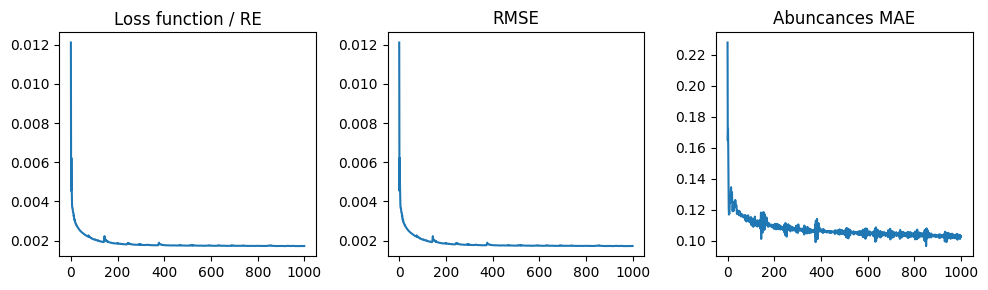

In [ ]:
plot_history(history, A_gt_tensor)

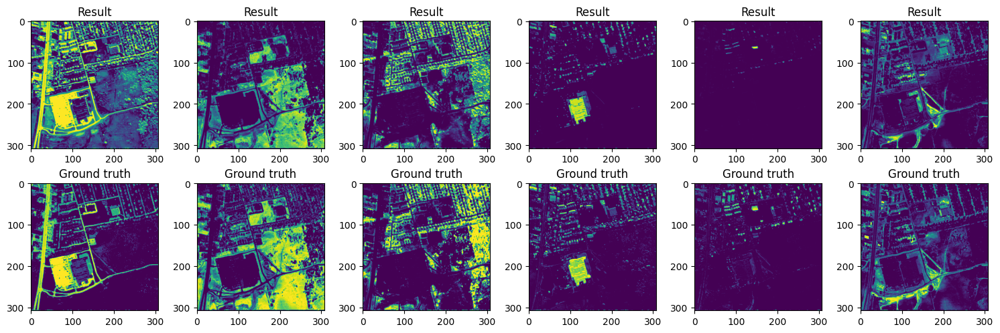

In [ ]:
view_results(r_channels, output, A_gt_tensor)